In [15]:
import fnv
import fnv.reduce
import fnv.file  
import numpy as np
import seaborn as sns
import datetime as dt
import time
import pandas as pd
from tkinter import filedialog
from tkinter import *
import os
import matplotlib.pyplot as plt
import glob
import h5py
import cv2
import gc

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2

# Use Agg backend for canvas
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas


h5py.run_tests()

...........s...........................................x...........................s.....s......................................x....................................sC:\Users\cloftus\Anaconda3\lib\site-packages\h5py\_hl\files.py:258: H5pyDeprecationWarning: File.fid has been deprecated. Use File.id instead.
  "Use File.id instead.", H5pyDeprecationWarning)
...s......ss.ss...............................................................................ss...................ssssss.....................................................................x....x.........................x......x..................................................ssss...................s........................................
----------------------------------------------------------------------
Ran 509 tests in 2.780s

OK (skipped=22, expected failures=6)


<unittest.runner.TextTestResult run=509 errors=0 failures=0>

In [2]:
os.chdir('C:/Users/cloftus/Desktop/')

In [3]:
options = np.array([000000, 200000, 400000, 600000, 800000, 1000000])

def round_to_fifth(time_):
    
    new = options[ abs(time_.microsecond - options).argmin() ]
    
    if new != 1000000:
        new_time = time_.replace(microsecond = new)
    else:
        temp_time = time_ + dt.timedelta(seconds = 1)
        new_time = temp_time.replace(microsecond = 000000)
    
    return(new_time)

def time_correct( _timestamp_ ):
    if drive == 'D:/thermal_data/':
        _timestamp_ = _timestamp_ - time_offset_D
    if drive == 'F:/':
        _timestamp_ = _timestamp_ - time_offset_F
        
    return(_timestamp_)

In [4]:
# root = Tk()
# root.filename =  filedialog.askopenfilename(initialdir = "/",title = "Select file",filetypes = (("jpeg files","*.jpg"),("all files","*.*")))
# print (root.filename)

In [5]:
datelist = [ d.date() for d in pd.date_range(start = pd.to_datetime('2019-08-06'), end = pd.to_datetime('2019-08-07')).to_pydatetime()]
print(datelist)

[datetime.date(2019, 8, 6), datetime.date(2019, 8, 7)]


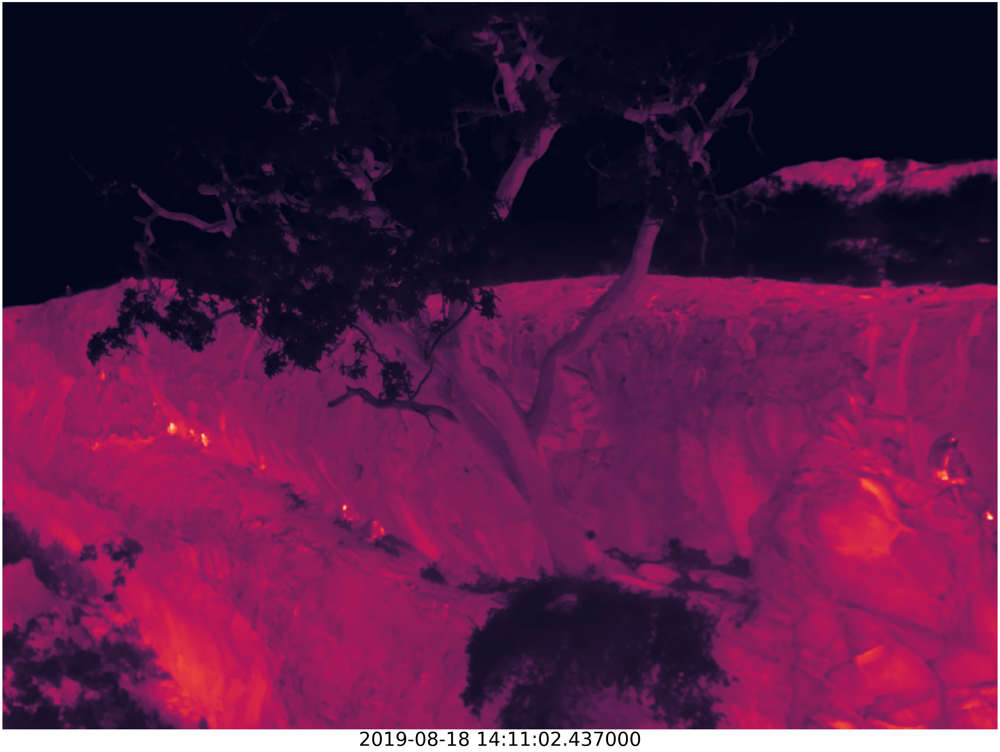

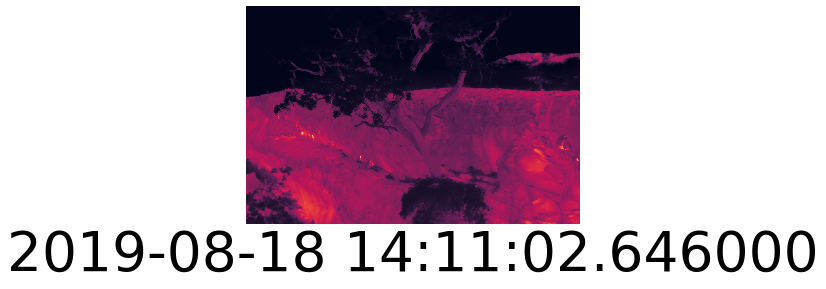

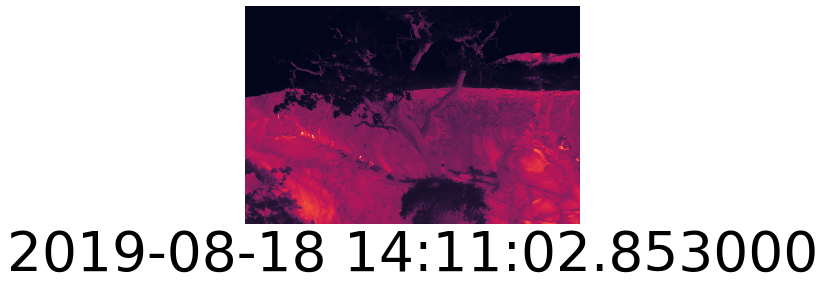

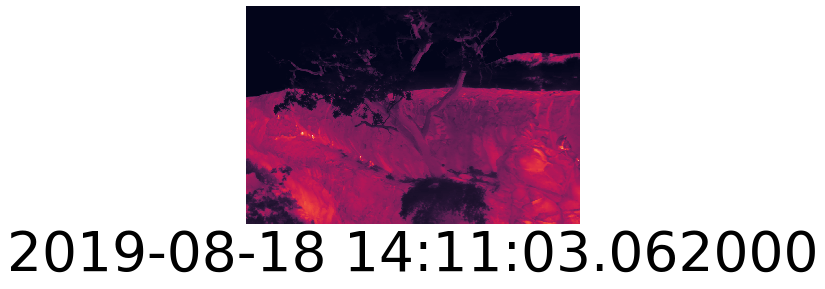

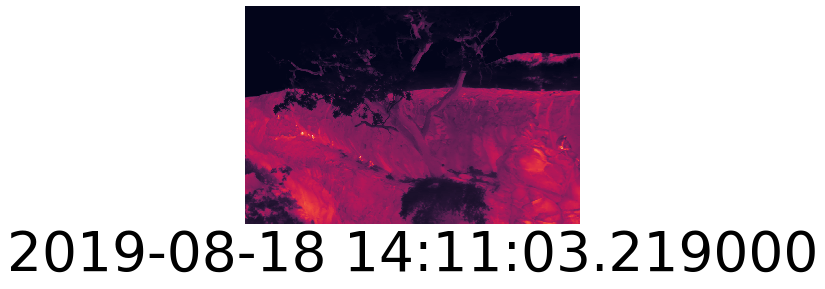

...

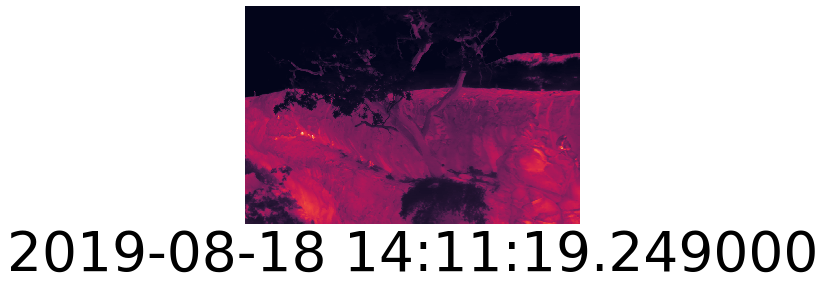

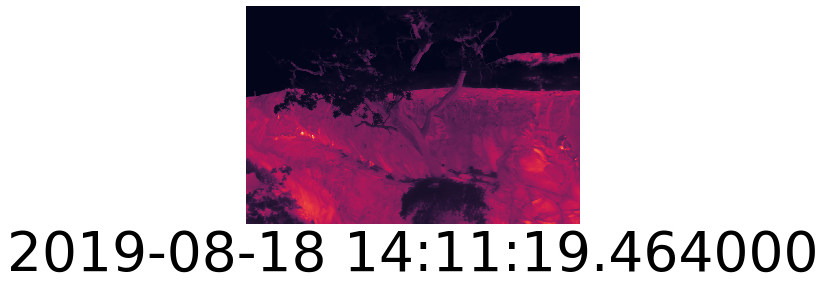

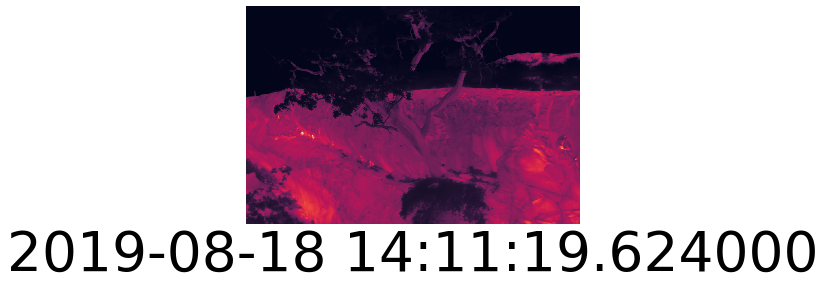

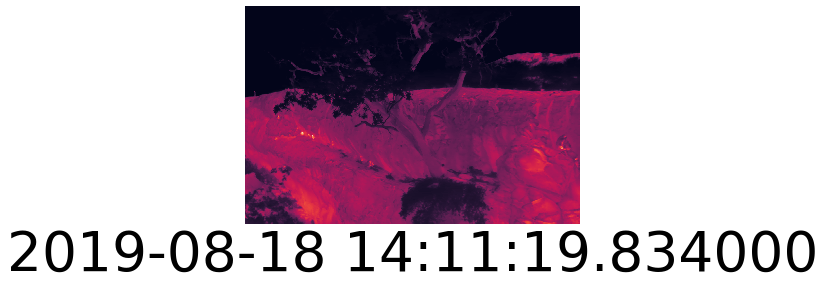

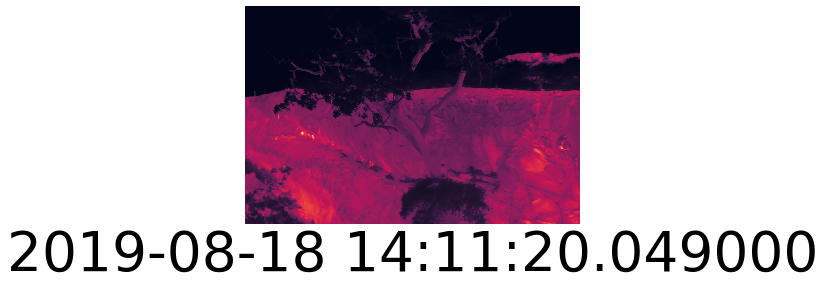

KeyboardInterrupt: 

In [42]:
## writes an openCV video from all frames in a given thermal video
# the individual frames are deleted from the hard drive as they are produced
# so no individual frames are saved

zoom = 5

drive = 'D:/'

start_timestamp = '2019-08-18'

vid_length = 5 ## real-time length of each video in seconds

start_dt = dt.datetime.strptime(start_timestamp, '%Y-%m-%d')

curr_date = f'{start_dt.year:04}' + f'{start_dt.month:02}' + f'{start_dt.day:02}'

os.chdir( drive + curr_date )

file_name = glob.glob('*.seq')

# im = fnv.file.ImagerFile(file_name[0])

im.get_frame(0)

day1 = int(im.frame_info[0]['value'][:3])

start = f'{start_dt.year:04}-' + f'{start_dt.month:02}-' + f'{start_dt.day:02} ' + im.frame_info[0]['value'][4:]

start_dt = dt.datetime.strptime(start, '%Y-%m-%d %H:%M:%S.%f')

#os.makedirs( 'C:/Users/cloftus/Desktop/vids_for_prediction/' + curr_date )
os.chdir( 'C:/Users/cloftus/Desktop/vids_for_prediction/' + curr_date )
            
    
final = np.array(im.final, copy = False).reshape((im.height, im.width))
    
plt_width = final.shape[1] / (100 / zoom)
    
plt_height = final.shape[0] / (100 / zoom)

fig = plt.figure(figsize = (plt_width, plt_height))  

cut_point = start_dt

for i in range(im.num_frames):
    
    im.get_frame(i)

    day2 = int(im.frame_info[0]['value'][:3])

    day_diff = day2 - day1

    timestamp = f'{start_dt.year:04}-' + f'{start_dt.month:02}-' + f'{(start_dt.day+day_diff):02} ' + im.frame_info[0]['value'][4:]

    timestamp = dt.datetime.strptime(timestamp, '%Y-%m-%d %H:%M:%S.%f')
        
    final = np.array(im.final, copy=False).reshape((im.height, im.width))

    final1 = final - final.mean()

    sns.heatmap(final1, vmin = -np.std(final1), vmax = final1.max(), xticklabels = False, yticklabels = False, cbar = False)

    if final1.shape[1] > 1000:

        plt.xlabel(  timestamp.strftime("%Y-%m-%d %H:%M:%S.%f") , fontsize = 55*zoom / 5 )

    else:

        plt.xlabel(  timestamp.strftime("%Y-%m-%d %H:%M:%S.%f") , fontsize = 25*zoom / 5 )

    if timestamp >= cut_point:
        
        if i != 0:
            cv2.destroyAllWindows()
            video.release()
        
        if i == 0:
            
            plt.savefig( f'{i:06}_' + timestamp.strftime("%Y%m%d_%H%M%S%f") + '.tiff' , bbox_inches = 'tight')

            frame = cv2.imread( f'{i:06}_' + timestamp.strftime("%Y%m%d_%H%M%S%f") + '.tiff' )
        
            height, width, layers = frame.shape
    
        video = cv2.VideoWriter(timestamp.strftime("%Y%m%d_%H%M%S%f") + '.avi', 0, 60, (width, height))
        
        cut_point += dt.timedelta( seconds = vid_length )

        
    # put pixel buffer in numpy array
    canvas = FigureCanvas(fig)
    canvas.draw()
    mat = np.array(canvas.renderer._renderer)
    mat = cv2.cvtColor(mat, cv2.COLOR_RGB2BGR)

    video.write( mat )

    fig.clear()
    
    del final, final1, day_diff, day2
    

    gc.collect()







In [38]:
fig.show()

AttributeError: 'FigureCanvasAgg' object has no attribute 'manager'
Figure.show works only for figures managed by pyplot, normally created by pyplot.figure().

In [36]:
canvas.draw()

In [37]:
plt.show()

In [ ]:

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import cv2

# Use Agg backend for canvas
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

# create OpenCV video writer
video = cv2.VideoWriter('video.mp4', cv2.VideoWriter_fourcc('A','V','C','1'), 1, (mat.shape[0],mat.shape[1]))

# loop over your images
for i in xrange(len(img)):

    fig = plt.figure()
    plt.imshow(img[i], cmap=cm.Greys_r)

    # put pixel buffer in numpy array
    canvas = FigureCanvas(fig)
    canvas.draw()
    mat = np.array(canvas.renderer._renderer)
    mat = cv2.cvtColor(mat, cv2.COLOR_RGB2BGR)

    # write frame to video
    video.write(mat)

# close video writer
cv2.destroyAllWindows()
video.release()

C:\Users\cloftus\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
  # This is added back by InteractiveShellApp.init_path()


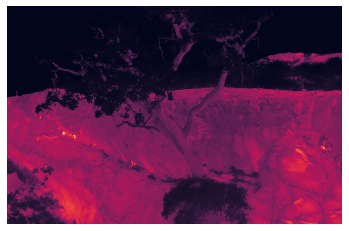

In [48]:
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
from matplotlib.figure import Figure

fig = Figure()
canvas = FigureCanvas(fig)
ax = sns.heatmap(final1, vmin = -np.std(final1), vmax = final1.max(), xticklabels = False, yticklabels = False, cbar = False)


canvas.draw()       # draw the canvas, cache the renderer

image = np.fromstring(canvas.tostring_rgb(), dtype='uint8')

In [46]:
image

array([255, 255, 255, ..., 255, 255, 255], dtype=uint8)

In [47]:
canvas.draw()

AttributeError: 'FigureCanvasAgg' object has no attribute 'show'